## Ground Risk Model, Using Harm, Impact, Expsure, and Coridor

Importing common library

In [5]:
#Import Online
import geopandas as gpd
import pandas as pd
import numpy as np
from upt.preprocessor.features_of_interest import FeatureOfInterest as foi
from upt.postprocessor.a_star import AStar
# from upt.utils.geo_utils import line_smoothing as lsp

import matplotlib.pyplot as plt
JakUt = foi('Jakarta Utara',crs=3857,zoom_level=18)
# JakUt_building_area = JakUt.area_of_interest({'military':True,'aeroway':True,'building':True,})

loaded


In [2]:
from upt.utils.file_handle import FileHandle
fh = FileHandle("7626002_Jakarta Utara")
JakUt_true_area = fh.load_gdf("Jakarta Utara_calculated_military_True",fh.feature_dir)
# JakUt_overlayer = fh.load_gdf("Jakarta Utara_overlay_building_True",fh.feature_dir)

C:\Users\MICKO\anaconda3\envs\ox\lib\site-packages\libpysal\cg\alpha_shapes.py:39: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def nb_dist(x, y):
C:\Users\MICKO\anaconda3\envs\ox\lib\site-packages\libpysal\cg\alpha_shapes.py:165: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def get_faces(triangle):
C:\Users\MICKO\anaconda3\envs\ox\lib\site-packages\libpysal\c

# PDF Map

In [2]:
final_risk = fh.load_gdf("Final_risk","D:\\TUGAS SEKOLAH\\College\\Smst 7, Odd 2023\\UAV PATH PLANNER\\city_data\\7626002_Jakarta Utara")

In [14]:
zel = JakUt.square_grid.to_crs("epsg:3857")

In [20]:
zel.iloc[0].area()

AttributeError: 'Series' object has no attribute 'area'

In [59]:
p_dense = fh.load_gdf("JakUt_popdense","D:\\TUGAS SEKOLAH\\College\\Smst 7, Odd 2023\\UAV PATH PLANNER\\Population Data")

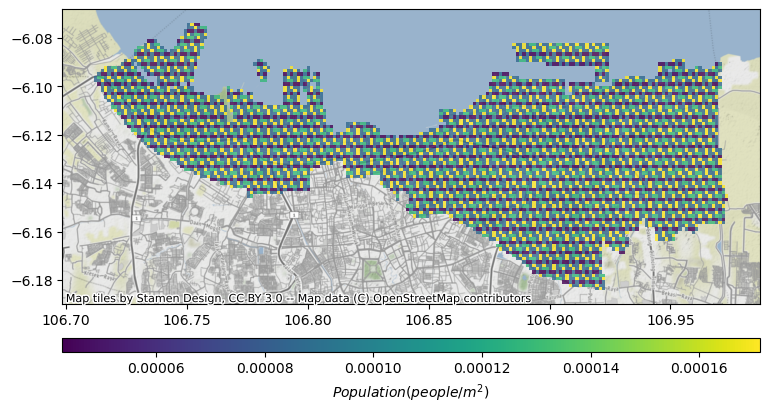

In [61]:
import contextily as ctx
import matplotlib.pyplot as plt

p_dense.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
p_dense.plot(column='population', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(p_dense['population'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Population (people/m^2)$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('plot_population_true.pdf', bbox_inches='tight')


plt.show()

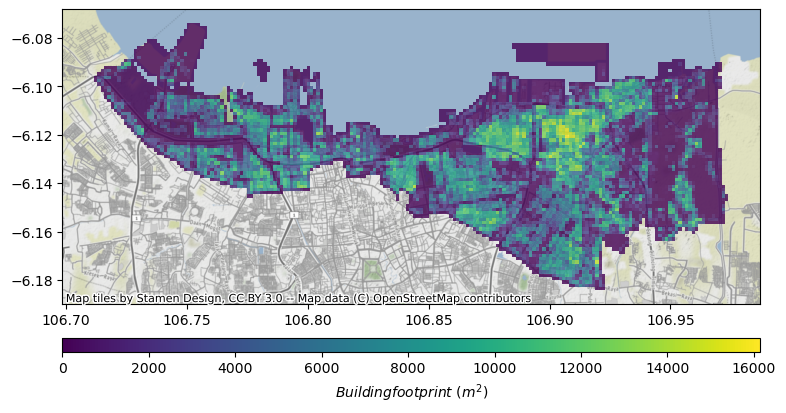

In [54]:
import contextily as ctx
import matplotlib.pyplot as plt

final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
final_risk.plot(column='area', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(final_risk['area'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Building footprint\ (m^2) $")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('plot_building footprint.pdf', bbox_inches='tight')


plt.show()

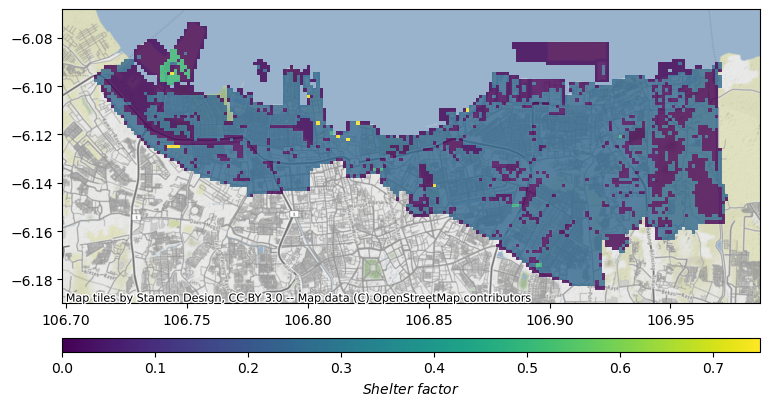

In [55]:
import contextily as ctx
import matplotlib.pyplot as plt

final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
final_risk.plot(column='shelter factor', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(final_risk['shelter factor'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Shelter\ factor$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('plot_shelter factor.pdf', bbox_inches='tight')


plt.show()

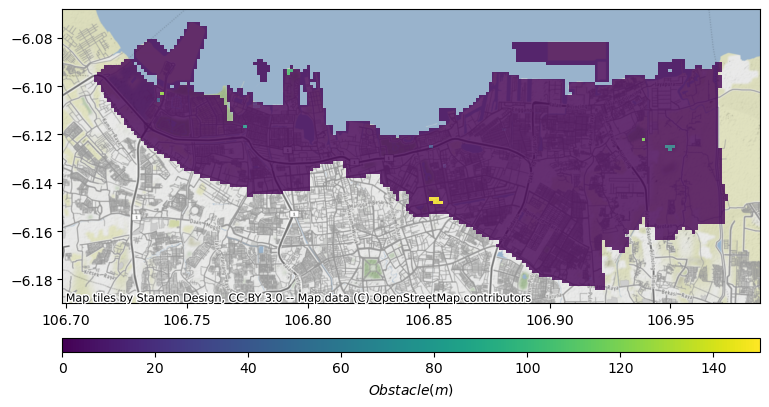

In [56]:
import contextily as ctx
import matplotlib.pyplot as plt

final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
final_risk.plot(column='height', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(final_risk['height'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Obstacle (m)$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('plot_obstacle.pdf', bbox_inches='tight')


plt.show()

# Aircraft List

In [1]:
talon = {
    'mass':3.75,
    'front area':0.1,
    'diagonal size':0.88,
    'endurance':75,
    'cd':0.9,
    'cruise speed':18,
    'glide speed':16,
    'glide descent angle': 4.76,
    'flight lv': 100
}

disco = {
    'mass':0.75,
    'front area':0.07,
    'diagonal size':0.575,
    'endurance':45,
    'cd':0.9,
    'cruise speed':15,
    'glide speed':12,
    'glide descent angle': 20.32,
    'flight lv': 100
}

phantom4 = {
    'mass':1.4,
    'front area':0.02,
    'diagonal size':0.2,
    'endurance':20,
    'cd':0.7,
    'cruise speed':15,
    'glide speed':7.5,
    'glide descent angle': 20.32,
    'flight lv': 100
}

inspire2 = {
    'mass':4.25,
    'front area':0.04,
    'diagonal size':0.4,
    'endurance':25,
    'cd':0.7,
    'cruise speed':20,
    'glide speed':10,
    'glide descent angle': 20.32,
    'flight lv': 100
}

In [8]:
import numpy as np
np.rad2deg(np.arctan(1/2.7))

20.32313682966294

In [ ]:
import contextily as ctx
import matplotlib.pyplot as plt

final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
final_risk.plot(column='flyaway impact', alpha=0.8, ax=ax)
b
sm = plt.cm.ScalarMappable()
sm.set_array(final_risk['flyaway impact'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Fatality$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
# plt.savefig('plot_population_true.pdf')


plt.show()

# Descent Model

In [2]:
import numpy as np

def fly_away_model(n_sampling, ac_profile, v_wind = 0 , wind_dir=0):
    wind_dir = np.deg2rad(wind_dir)
    v_wind_x = np.cos(wind_dir)*v_wind
    v_wind_y = np.sin(wind_dir)*v_wind
    glide_speed = ac_profile['glide speed']
    cruise_speed = ac_profile['cruise speed']
    endurance = ac_profile['endurance']*60
    
    sample_points = np.random.normal(cruise_speed, 3, size=(n_sampling))
    gamma = np.arctan(np.deg2rad(ac_profile['glide descent angle']))
    flight_lv = ac_profile['flight_lv']
    mass = ac_profile['mass']
    
    def fly_away(v_sample):
        point_list = []
        for v in v_sample:
            
            angle_degree = np.random.uniform(0,2*np.pi)
            
            radial_func_x = lambda angle : v*np.cos(angle)
            radial_func_y = lambda angle : v*np.sin(angle)
            
            vg_x = radial_func_x(angle_degree) + v_wind_x
            vg_y = radial_func_y(angle_degree) + v_wind_y
            v_magnitude = np.linalg.norm([vg_x,vg_y])
            
            range_max_x = endurance*(1/2)*vg_x
            range_max_y = endurance*(1/2)*vg_y
            
            flight_lv_dist = np.random.normal(flight_lv, 1)
            td = flight_lv_dist/v_magnitude*np.sin(gamma)
            
            angle_radians = np.arctan2(vg_y, vg_x)
            angle_radians = (angle_radians + 2*np.pi) % (2*np.pi)
            
            point_x = v_magnitude*td*np.cos(angle_radians)+range_max_x
            point_y = v_magnitude*td*np.sin(angle_radians)+range_max_y
            

            E_imp = 1/2*mass*v_magnitude**2
            point_list.append((point_x,point_y, E_imp))
        return (np.array(point_list))

    crash_point = fly_away(sample_points)
    crash_point = np.column_stack((crash_point))
    return(crash_point)

In [3]:
import numpy as np

def ballistic_model(n_sampling, ac_profile, v_wind = 0 , wind_dir=0):
    wind_dir = np.deg2rad(wind_dir)
    v_wind_x = np.cos(wind_dir)*v_wind
    v_wind_y = np.sin(wind_dir)*v_wind
    
    cruise_speed = ac_profile['cruise speed']
    flight_lv = ac_profile['flight_lv']
    cd = ac_profile['cd']
    mass = ac_profile['mass']

    g = 9.81
    weight = mass*g
    Gamma = np.sqrt(weight/cd)
    m_log2 = mass*np.log(2)
    
    sample_points = np.random.normal(cruise_speed, 3, size=(n_sampling))
    def ballistic(v_sample):
        point_list = []
        for v in v_sample:
            
            angle_degree = np.random.uniform(0,2*np.pi)
            
            radial_func_x = lambda angle : v*np.cos(angle)
            radial_func_y = lambda angle : v*np.sin(angle)
            
            vg_x = radial_func_x(angle_degree) + v_wind_x
            vg_y = radial_func_y(angle_degree) + v_wind_y
            v_magnitude = np.linalg.norm([vg_x,vg_y])
            
            flight_lv_dist = np.random.normal(flight_lv, 1)
            td = ((m_log2 + cd*flight_lv_dist)*Gamma)/weight
            
            angle_radians = np.arctan2(vg_y, vg_x)
            angle_radians = (angle_radians + 2*np.pi) % (2*np.pi)
            
            point_x = v_magnitude*td*np.cos(angle_radians)
            point_y = v_magnitude*td*np.sin(angle_radians)
            
            E_imp = 1/2*mass*v_magnitude**2
            point_list.append((point_x,point_y, E_imp))
        return (np.array(point_list))

    crash_point = ballistic(sample_points)
    crash_point = np.column_stack((crash_point))
    return(crash_point)

In [4]:
import numpy as np

def glide_model(n_sampling, ac_profile, v_wind = 0 , wind_dir=0):
    wind_dir = np.deg2rad(wind_dir)
    v_wind_x = np.cos(wind_dir)*v_wind
    v_wind_y = np.sin(wind_dir)*v_wind
    glide_speed = ac_profile['glide speed']
    
    sample_points = np.random.normal(glide_speed, 3, size=(n_sampling))
    gamma = np.arctan(np.deg2rad(ac_profile['glide descent angle']))
    flight_lv = ac_profile['flight_lv']
    mass = ac_profile['mass']
    
    def glide(v_sample):
        point_list = []
        for v in v_sample:
            
            angle_degree = np.random.uniform(0,2*np.pi)
            
            radial_func_x = lambda angle : v*np.cos(angle)
            radial_func_y = lambda angle : v*np.sin(angle)
            
            vg_x = radial_func_x(angle_degree) + v_wind_x
            vg_y = radial_func_y(angle_degree) + v_wind_y
            v_magnitude = np.linalg.norm([vg_x,vg_y])
            
            flight_lv_dist = np.random.normal(flight_lv, 1)
            td = flight_lv_dist/v_magnitude*np.sin(gamma)
            
            angle_radians = np.arctan2(vg_y, vg_x)
            angle_radians = (angle_radians + 2*np.pi) % (2*np.pi)
            
            point_x = v_magnitude*td*np.cos(angle_radians)
            point_y = v_magnitude*td*np.sin(angle_radians)

            E_imp = 1/2*mass*v_magnitude**2
            point_list.append((point_x,point_y, E_imp))
        return (np.array(point_list))

    crash_point = glide(sample_points)
    crash_point = np.column_stack((crash_point))
    return(crash_point)

In [8]:
import numpy as np

def parachute_model(n_sampling, ac_profile, v_wind = 0 , wind_dir=0):
    wind_dir = np.deg2rad(wind_dir)
    v_wind_x = np.cos(wind_dir)*v_wind
    v_wind_y = np.sin(wind_dir)*v_wind
    
    cruise_speed = 0
    flight_lv = ac_profile['flight_lv']
    cd = ac_profile['cd']
    mass = ac_profile['mass']

    g = 9.81
    weight = mass*g
    Gamma = np.sqrt(weight/cd)
    m_log2 = mass*np.log(2)
    
    sample_points = np.random.normal(cruise_speed, 1, size=(n_sampling))
    def parachute(v_sample):
        point_list = []
        for v in v_sample:
            
            angle_degree = np.random.uniform(0,2*np.pi)
            
            radial_func_x = lambda angle : v*np.cos(angle)
            radial_func_y = lambda angle : v*np.sin(angle)
            
            vg_x = radial_func_x(angle_degree) + v_wind_x
            vg_y = radial_func_y(angle_degree) + v_wind_y
            v_magnitude = np.linalg.norm([vg_x,vg_y])
            
            flight_lv_dist = np.random.normal(flight_lv, 1)
            td = ((m_log2 + cd*flight_lv_dist)*Gamma)/weight
            
            angle_radians = np.arctan2(vg_y, vg_x)
            angle_radians = (angle_radians + 2*np.pi) % (2*np.pi)
            
            point_x = v_magnitude*td*np.cos(angle_radians)
            point_y = v_magnitude*td*np.sin(angle_radians)
            
            E_imp = 1/2*mass*v_magnitude**2
            point_list.append((point_x,point_y, E_imp))
        return (np.array(point_list))

    crash_point = parachute(sample_points)
    crash_point = np.column_stack((crash_point))
    return(crash_point)

In [9]:
talon = {
    'mass':3.75,
    'front area':0.1,
    'diagonal size':0.88,
    'endurance':75,
    'cd':0.9,
    'cd parachute' : 1.3,
    'cruise speed':18,
    'glide speed':16,
    'glide descent angle': 4.76,
    'flight_lv': 100
}

disco = {
    'mass':0.75,
    'front area':0.07,
    'diagonal size':0.575,
    'endurance':45,
    'cd':0.9,
    'cd parachute' : 1.3,
    'cruise speed':15,
    'glide speed':12,
    'glide descent angle': 20.32,
    'flight_lv': 100
}

phantom4 = {
    'mass':1.4,
    'front area':0.02,
    'diagonal size':0.2,
    'endurance':20,
    'cd':0.7,
    'cd parachute' : 0.9,
    'cruise speed':15,
    'glide speed':7.5,
    'glide descent angle': 20.32,
    'flight_lv': 100
}

inspire2 = {
    'mass':4.25,
    'front area':0.04,
    'diagonal size':0.4,
    'endurance':25,
    'cd':0.7,
    'cd parachute' : 1.3,
    'cruise speed':20,
    'glide speed':10,
    'glide descent angle': 20.32,
    'flight_lv': 100
}

talon_ballistic_descent = ballistic_model(1000, talon, 10, 75)
talon_fly_descent = fly_away_model(1000, talon, 10,  75)
talon_glide_descent = glide_model(1000, talon, 10, 75)
talon_parachute_descent = parachute_model(1000, talon, 10, 75)

phantom4_ballistic_descent = ballistic_model(1000, phantom4, 10, 75)
phantom4_fly_descent = fly_away_model(1000, phantom4, 10,  75)
phantom4_glide_descent = glide_model(1000, phantom4, 10, 75)
phantom4_parachute_descent = parachute_model(1000, talon, 10, 75)

## Talon, Fixed wing, Ballistic

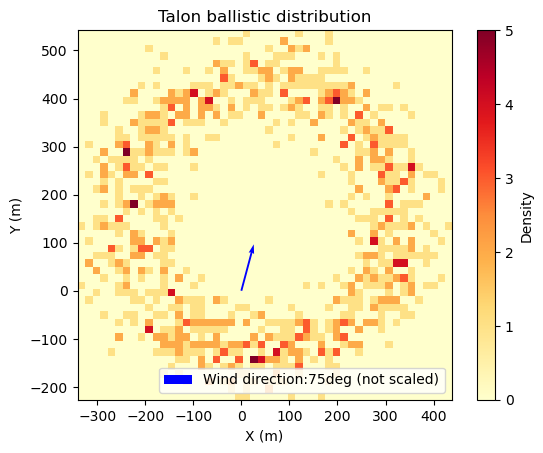

In [6]:
import matplotlib.pyplot as plt
import numpy as np

# Generate random x and y points
np.random.seed(0)
x = talon_ballistic_descent[0]
y = talon_ballistic_descent[1]

# Define the grid size
grid_size = 50

# Create a 2D histogram
heatmap, xedges, yedges = np.histogram2d(x, y, bins=grid_size)

# Create the plot
fig, ax = plt.subplots()

# Plot the heatmap
ax.imshow(heatmap.T, cmap='YlOrRd', origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])

# Add a colorbar
cbar = plt.colorbar(ax.images[0], ax=ax, label='Density')

# Add labels and title
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_title('Talon ballistic distribution')

# Add wind vector arrow at 0 location
ax.quiver(0, 0, 100*np.cos(np.deg2rad(75)), 100*np.sin(np.deg2rad(75)), angles='xy', scale_units='xy', scale=1, color='blue', width=0.005, label="Wind direction:75deg (not scaled)", )
plt.legend(loc="lower right")
# Show the plot
plt.savefig('Talon ballistic distribution.pdf', bbox_inches='tight')
plt.show()



## Talon, Fixed wing, Fly Away

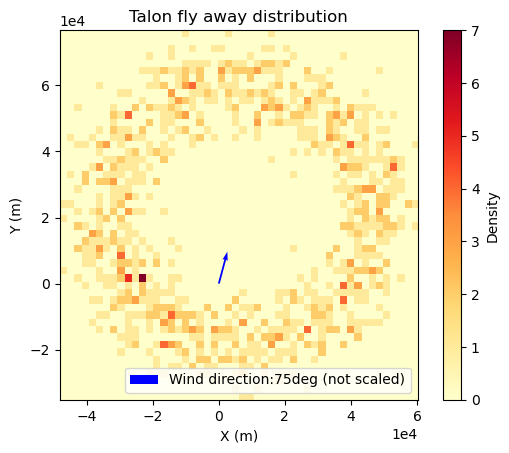

In [7]:
import matplotlib.pyplot as plt
import numpy as np

# Generate random x and y points
np.random.seed(0)
x = talon_fly_descent[0]
y = talon_fly_descent[1]

# Define the grid size
grid_size = 50

# Create a 2D histogram
heatmap, xedges, yedges = np.histogram2d(x, y, bins=grid_size)

# Create the plot
fig, ax = plt.subplots()

# Plot the heatmap
ax.imshow(heatmap.T, cmap='YlOrRd', origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])

# Add a colorbar
cbar = plt.colorbar(ax.images[0], ax=ax, label='Density')

# Add labels and title
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_title('Talon fly away distribution')

# Add wind vector arrow at 0 location
ax.quiver(0, 0, 10000*np.cos(np.deg2rad(75)), 10000*np.sin(np.deg2rad(75)), angles='xy', scale_units='xy', scale=1, color='blue', width=0.005, label="Wind direction:75deg (not scaled)", )
plt.legend(loc="lower right")
plt.ticklabel_format(style='sci', axis='both', scilimits=(0,0))
plt.savefig('Talon fly away distribution.pdf', bbox_inches='tight')
# Show the plot
plt.show()



## Talon, Fixed wing, Glide Descent

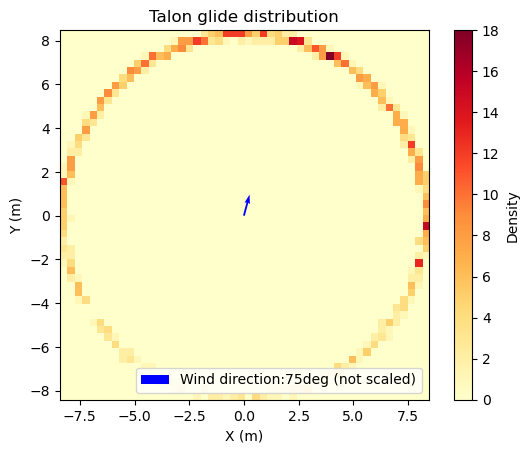

In [11]:
import matplotlib.pyplot as plt
import numpy as np

# Generate random x and y points
np.random.seed(0)
x = talon_glide_descent[0]
y = talon_glide_descent[1]

# Define the grid size
grid_size = 50

# Create a 2D histogram
heatmap, xedges, yedges = np.histogram2d(x, y, bins=grid_size)

# Create the plot
fig, ax = plt.subplots()

# Plot the heatmap
ax.imshow(heatmap.T, cmap='YlOrRd', origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])

# Add a colorbar
cbar = plt.colorbar(ax.images[0], ax=ax, label='Density')

# Add labels and title
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_title('Talon glide distribution')

# Add wind vector arrow at 0 location
ax.quiver(0, 0, np.cos(np.deg2rad(75)), np.sin(np.deg2rad(75)), angles='xy', scale_units='xy', scale=1, color='blue', width=0.005, label="Wind direction:75deg (not scaled)", )
plt.legend(loc="lower right")
plt.savefig('Talon glide distribution.pdf', bbox_inches='tight')
# Show the plot
plt.show()



## Talon, Fixed wing, Parachute

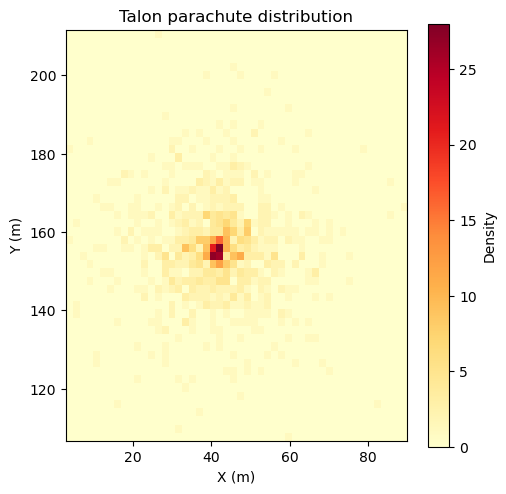

In [34]:
import matplotlib.pyplot as plt
import numpy as np

# Generate random x and y points
np.random.seed(0)
x = talon_parachute_descent[0]
y = talon_parachute_descent[1]

# Define the grid size
grid_size = 50

# Create a 2D histogram
heatmap, xedges, yedges = np.histogram2d(x, y, bins=grid_size)

# Create the plot
fig, ax = plt.subplots(figsize=(5.5, 5.5))

# Plot the heatmap
ax.imshow(heatmap.T, cmap='YlOrRd', origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])

# Add a colorbar
cbar = plt.colorbar(ax.images[0], ax=ax, label='Density')

# Add labels and title
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_title('Talon parachute distribution')
ax.set_aspect('equal')

# Add wind vector arrow at 0 location
# ax.quiver(0, 0, 1*np.cos(np.deg2rad(75)), 0.01*np.sin(np.deg2rad(75)), angles='xy', scale_units='xy', scale=1, color='blue', width=0.005, label="Wind direction:75deg (not scaled)", )
# plt.legend(loc="lower right")
plt.savefig('Talon parachute distribution.pdf', bbox_inches='tight')
# Show the plot
plt.show()



## Phantom, Fixed wing, Ballistic

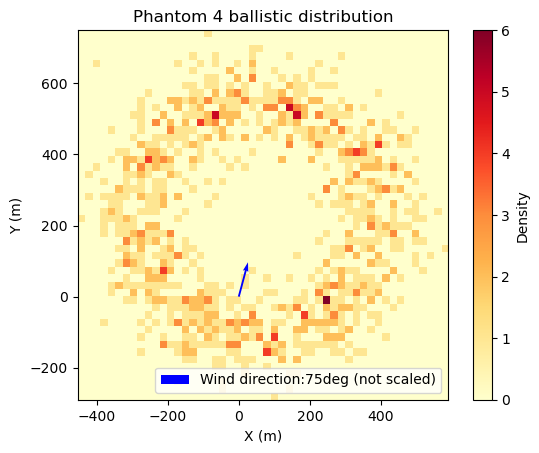

In [9]:
import matplotlib.pyplot as plt
import numpy as np

# Generate random x and y points
np.random.seed(0)
x = phantom4_ballistic_descent[0]
y = phantom4_ballistic_descent[1]

# Define the grid size
grid_size = 50

# Create a 2D histogram
heatmap, xedges, yedges = np.histogram2d(x, y, bins=grid_size)

# Create the plot
fig, ax = plt.subplots()

# Plot the heatmap
ax.imshow(heatmap.T, cmap='YlOrRd', origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])

# Add a colorbar
cbar = plt.colorbar(ax.images[0], ax=ax, label='Density')

# Add labels and title
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_title('Phantom 4 ballistic distribution')

# Add wind vector arrow at 0 location
ax.quiver(0, 0, 100*np.cos(np.deg2rad(75)), 100*np.sin(np.deg2rad(75)), angles='xy', scale_units='xy', scale=1, color='blue', width=0.005, label="Wind direction:75deg (not scaled)", )
plt.legend(loc="lower right")
plt.savefig('Phantom 4 ballistic distribution.pdf', bbox_inches='tight')
# Show the plot
plt.show()



## Phantom, Fixed wing, Fly Away

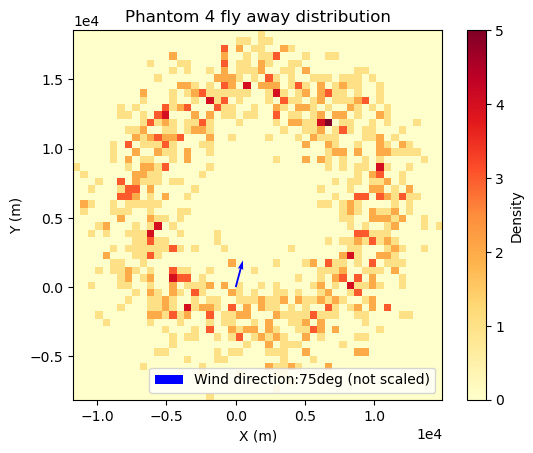

In [10]:
import matplotlib.pyplot as plt
import numpy as np

# Generate random x and y points
np.random.seed(0)
x = phantom4_fly_descent[0]
y = phantom4_fly_descent[1]

# Define the grid size
grid_size = 50

# Create a 2D histogram
heatmap, xedges, yedges = np.histogram2d(x, y, bins=grid_size)

# Create the plot
fig, ax = plt.subplots()

# Plot the heatmap
ax.imshow(heatmap.T, cmap='YlOrRd', origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])

# Add a colorbar
cbar = plt.colorbar(ax.images[0], ax=ax, label='Density')

# Add labels and title
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_title('Phantom 4 fly away distribution')

# Add wind vector arrow at 0 location
ax.quiver(0, 0, 2000*np.cos(np.deg2rad(75)), 2000*np.sin(np.deg2rad(75)), angles='xy', scale_units='xy', scale=1, color='blue', width=0.005, label="Wind direction:75deg (not scaled)", )
plt.legend(loc="lower right")
plt.ticklabel_format(style='sci', axis='both', scilimits=(0,0))
plt.savefig('Phantom 4 fly away distribution.pdf', bbox_inches='tight')
# Show the plot
plt.show()



## Phnatom, Fixed wing, Glide Descent

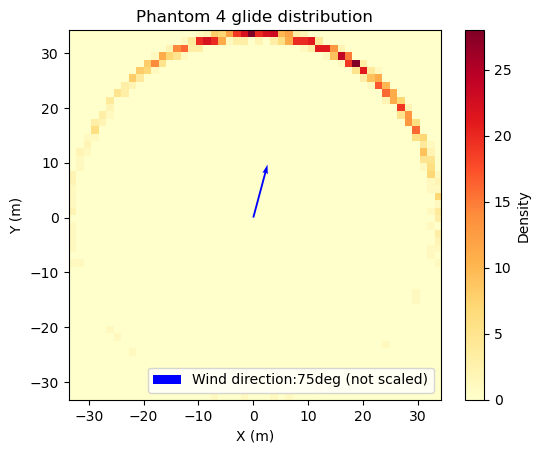

In [11]:
import matplotlib.pyplot as plt
import numpy as np

# Generate random x and y points
np.random.seed(0)
x = phantom4_glide_descent[0]
y = phantom4_glide_descent[1]

# Define the grid size
grid_size = 50

# Create a 2D histogram
heatmap, xedges, yedges = np.histogram2d(x, y, bins=grid_size)

# Create the plot
fig, ax = plt.subplots()

# Plot the heatmap
ax.imshow(heatmap.T, cmap='YlOrRd', origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])

# Add a colorbar
cbar = plt.colorbar(ax.images[0], ax=ax, label='Density')

# Add labels and title
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_title('Phantom 4 glide distribution')

# Add wind vector arrow at 0 location
ax.quiver(0, 0, 10*np.cos(np.deg2rad(75)), 10*np.sin(np.deg2rad(75)), angles='xy', scale_units='xy', scale=1, color='blue', width=0.005, label="Wind direction:75deg (not scaled)", )
plt.legend(loc="lower right")
plt.savefig('Phantom 4 glide distribution.pdf', bbox_inches='tight')
# Show the plot
plt.show()



## Phnatom, Fixed wing, Parachute Descent

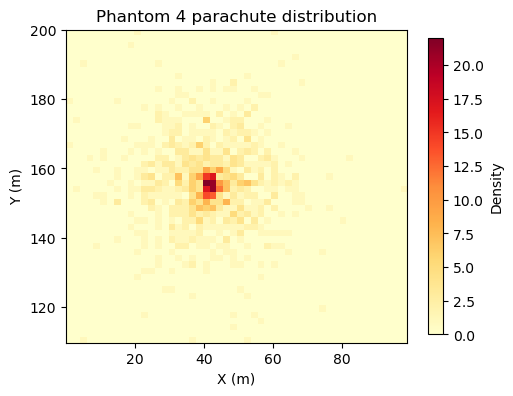

In [33]:
import matplotlib.pyplot as plt
import numpy as np

# Generate random x and y points
np.random.seed(0)
x = phantom4_parachute_descent[0]
y = phantom4_parachute_descent[1]

# Define the grid size
grid_size = 50

# Create a 2D histogram
heatmap, xedges, yedges = np.histogram2d(x, y, bins=grid_size)

# Create the plot
fig, ax = plt.subplots(figsize=(5.5, 5.5))

# Plot the heatmap
ax.imshow(heatmap.T, cmap='YlOrRd', origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])

# Add a colorbar
cbar = plt.colorbar(ax.images[0], ax=ax, label='Density',shrink=0.7)

# Add labels and title
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_title('Phantom 4 parachute distribution')
ax.set_aspect('equal')

# Add wind vector arrow at 0 location
# ax.quiver(0, 0, 1*np.cos(np.deg2rad(75)), 0.01*np.sin(np.deg2rad(75)), angles='xy', scale_units='xy', scale=1, color='blue', width=0.005, label="Wind direction:75deg (not scaled)", )
plt.savefig('Phantom 4 parachute distribution.pdf', bbox_inches='tight')
# Show the plot
plt.show()



# Talon

In [3]:
talon_final_risk = fh.load_gdf("Talon Final_risk","D:\\TUGAS SEKOLAH\\College\\Smst 7, Odd 2023\\UAV PATH PLANNER\\city_data\\7626002_Jakarta Utara")

In [9]:
talon_final_risk.columns

Index(['geometry', 'quadkey', 'id', 'area', 'shelter factor', 'no fly zone',
       'height', 'population', 'pre fatality', 'impact score',
       'fly level score', 'fatality risk total', 'total risk', 'risk non inf',
       'ballistic risk', 'glide risk', 'flyaway risk'],
      dtype='object')

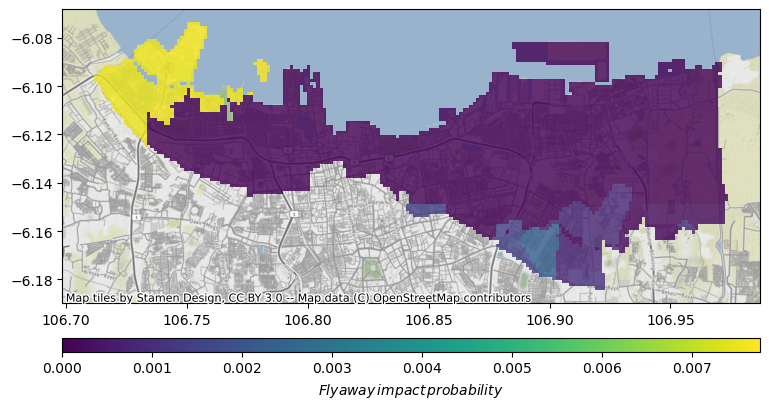

In [38]:
import contextily as ctx
import matplotlib.pyplot as plt

talon_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
talon_final_risk.plot(column='flyaway risk', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(talon_final_risk['flyaway risk'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Flyaway \,impact\,probability$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=talon_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Talon flyaway risk.pdf', bbox_inches='tight')


plt.show()

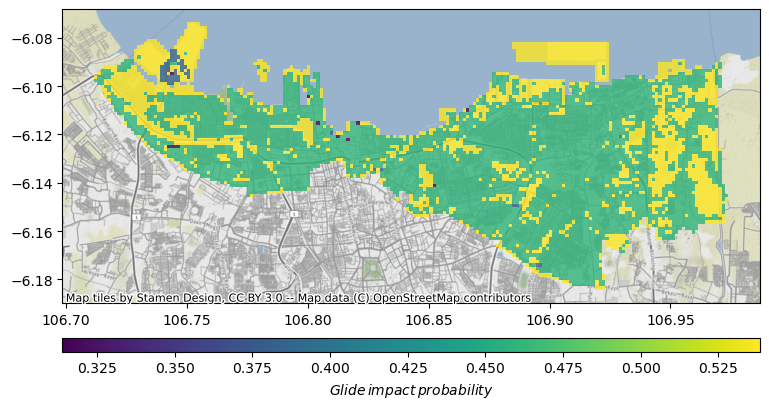

In [39]:
import contextily as ctx
import matplotlib.pyplot as plt

talon_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
talon_final_risk.plot(column='glide risk', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(talon_final_risk['glide risk'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Glide \,impact\,probability$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=talon_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Talon Glide risk.pdf', bbox_inches='tight')


plt.show()

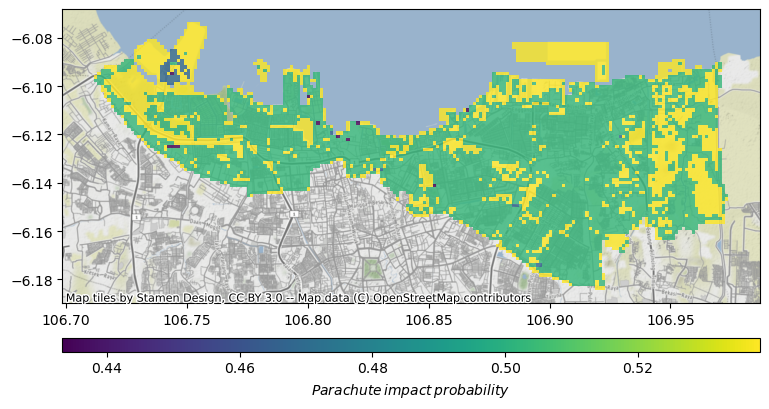

In [41]:
import contextily as ctx
import matplotlib.pyplot as plt

talon_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
talon_final_risk.plot(column='parachute risk', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(talon_final_risk['parachute risk'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Parachute \,impact\,probability$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=talon_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Talon Parachute risk.pdf', bbox_inches='tight')


plt.show()

In [42]:
astar = AStar(talon_final_risk,'fatality risk total',crs=talon_final_risk.crs)
astar.run_instance(3,2000)
way_marker = astar.create_line()

from upt.postprocessor.line_smoothing import non_smooth
gpd_proccessed = non_smooth(way_marker, talon_final_risk.crs)

import matplotlib.pyplot as plt
fig, ax = plt.subplots()

# Plot the first map
talon_final_risk.plot(ax=ax, color='blue')

# Plot the second map on top
line_sjoin.plot(column="fatality risk total", ax=ax, color='red')

# Set any additional customization options for the plot
ax.set_title('Multiple GeoPandas Maps')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Display the plot
plt.show()

NameError: name 'AStar' is not defined

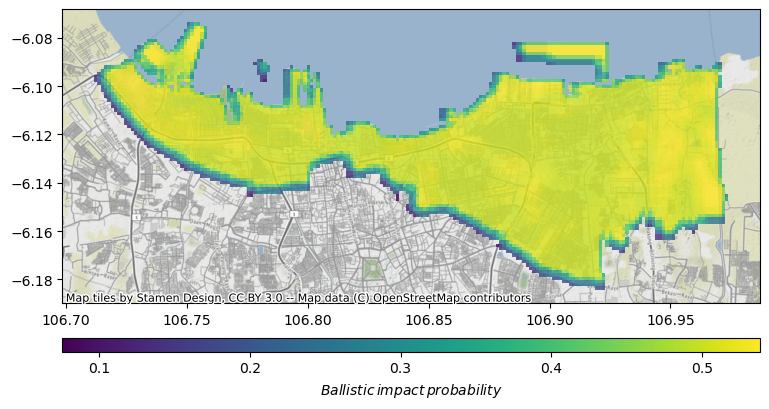

In [43]:
import contextily as ctx
import matplotlib.pyplot as plt

talon_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
talon_final_risk.plot(column='ballistic risk', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(talon_final_risk['ballistic risk'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Ballistic\,impact\,probability$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=talon_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Talon Ballistic risk.pdf', bbox_inches='tight')


plt.show()

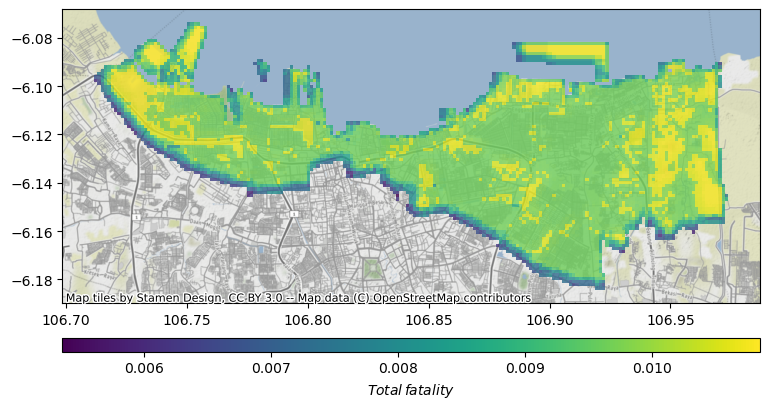

In [44]:
import contextily as ctx
import matplotlib.pyplot as plt

talon_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
talon_final_risk.plot(column='fatality risk total', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(talon_final_risk['fatality risk total'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Total\,fatality$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=talon_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Talon total fatality.pdf', bbox_inches='tight')


plt.show()

# Phantom 4

In [7]:
phantom4_final_risk = fh.load_gdf("Phantom 4 Final_risk","D:\\TUGAS SEKOLAH\\College\\Smst 7, Odd 2023\\UAV PATH PLANNER\\city_data\\7626002_Jakarta Utara")

Ballistic

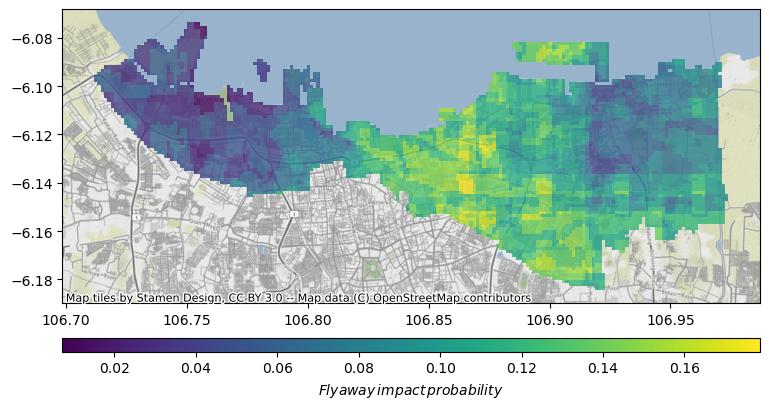

In [46]:
import contextily as ctx
import matplotlib.pyplot as plt

phantom4_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
phantom4_final_risk.plot(column='flyaway risk', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(phantom4_final_risk['flyaway risk'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Flyaway \,impact\,probability$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=phantom4_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Phantom Flyaway Risk.pdf', bbox_inches='tight')


plt.show()

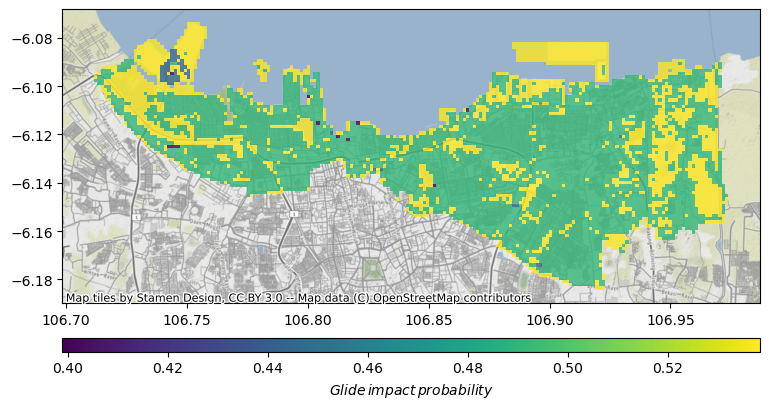

In [47]:
import contextily as ctx
import matplotlib.pyplot as plt

phantom4_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
phantom4_final_risk.plot(column='glide risk', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(phantom4_final_risk['glide risk'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Glide \,impact\,probability$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=phantom4_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Phantom Glide Risk.pdf', bbox_inches='tight')


plt.show()

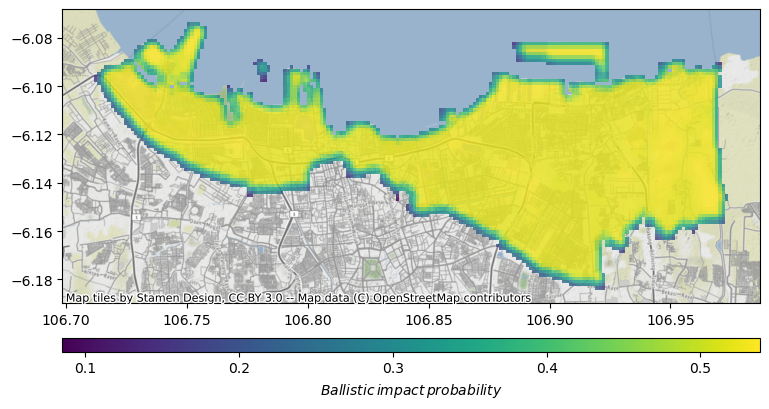

In [48]:
import contextily as ctx
import matplotlib.pyplot as plt

phantom4_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
phantom4_final_risk.plot(column='ballistic risk', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(phantom4_final_risk['ballistic risk'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Ballistic\,impact\,probability$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=phantom4_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Phantom Ballistic Risk.pdf', bbox_inches='tight')


plt.show()

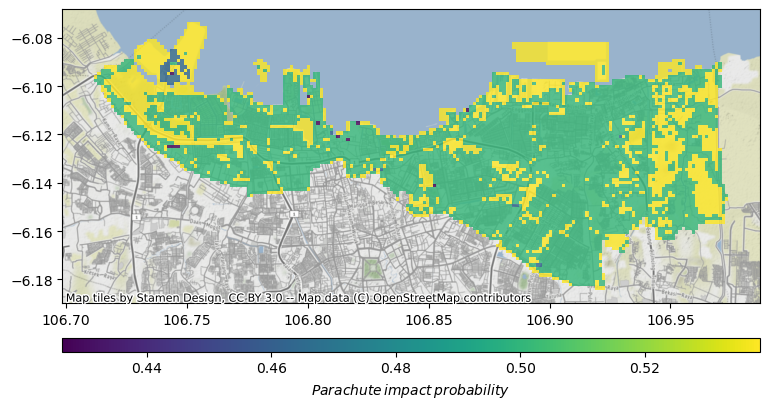

In [50]:
import contextily as ctx
import matplotlib.pyplot as plt

phantom4_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
phantom4_final_risk.plot(column='parachute risk', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(phantom4_final_risk['parachute risk'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Parachute \,impact\,probability$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=phantom4_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Phantom Parachute Risk.pdf', bbox_inches='tight')


plt.show()

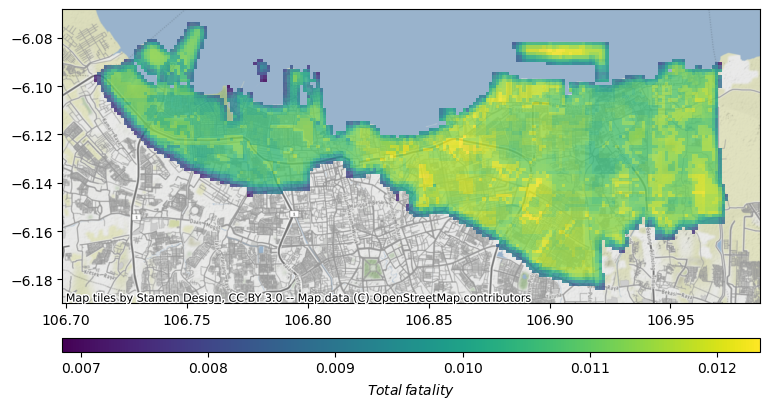

In [49]:
import contextily as ctx
import matplotlib.pyplot as plt

phantom4_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
phantom4_final_risk.plot(column='fatality risk total', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(phantom4_final_risk['fatality risk total'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Total\,fatality$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=phantom4_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Phantom Total Fatality.pdf', bbox_inches='tight')


plt.show()

# Inspire 2

In [8]:
inspire2_final_risk = fh.load_gdf("Inspire 2 Final_risk","D:\\TUGAS SEKOLAH\\College\\Smst 7, Odd 2023\\UAV PATH PLANNER\\city_data\\7626002_Jakarta Utara")

In [60]:
inspire2_final_risk.columns

Index(['geometry', 'quadkey', 'id', 'area', 'shelter factor', 'no fly zone',
       'height', 'population', 'pre fatality', 'impact score',
       'fly level score', 'fatality risk total', 'total risk', 'risk non inf',
       'ballistic risk', 'glide risk', 'flyaway risk', 'parachute risk'],
      dtype='object')

Ballistic

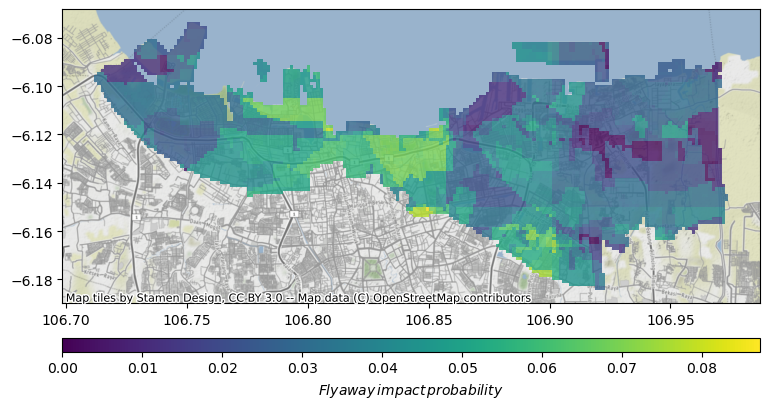

In [61]:
import contextily as ctx
import matplotlib.pyplot as plt

inspire2_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
inspire2_final_risk.plot(column='flyaway risk', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(inspire2_final_risk['flyaway risk'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Flyaway \,impact\,probability$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=inspire2_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Inspire Flyaway Risk.pdf', bbox_inches='tight')


plt.show()

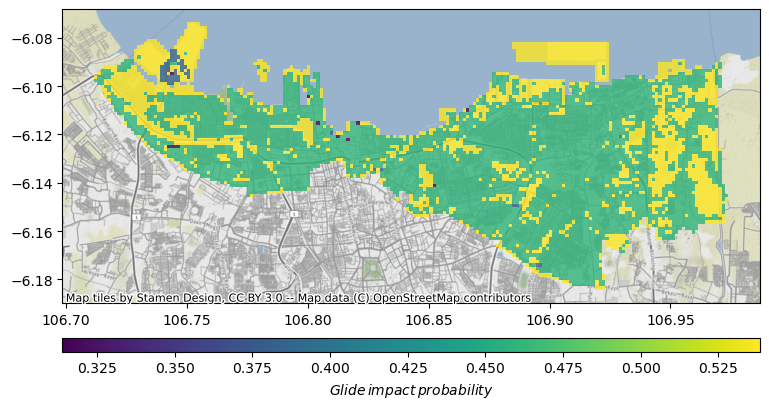

In [62]:
import contextily as ctx
import matplotlib.pyplot as plt

inspire2_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
inspire2_final_risk.plot(column='glide risk', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(inspire2_final_risk['glide risk'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Glide \,impact\,probability$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=inspire2_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Inspire Glide Risk.pdf', bbox_inches='tight')


plt.show()

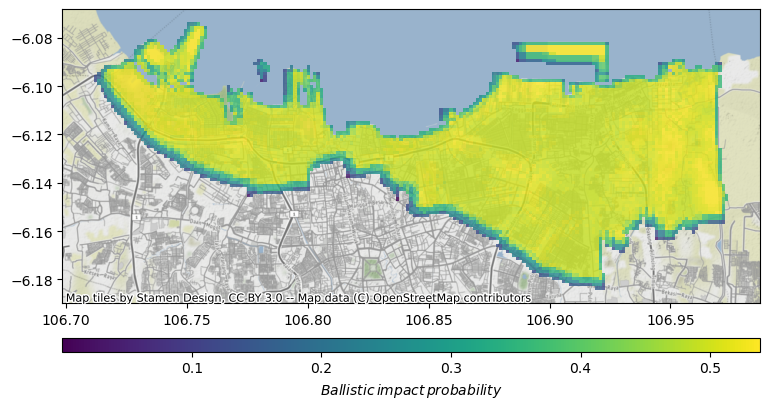

In [63]:
import contextily as ctx
import matplotlib.pyplot as plt

inspire2_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
inspire2_final_risk.plot(column='ballistic risk', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(inspire2_final_risk['ballistic risk'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Ballistic\,impact\,probability$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=inspire2_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Inspire Ballistic Risk.pdf', bbox_inches='tight')


plt.show()

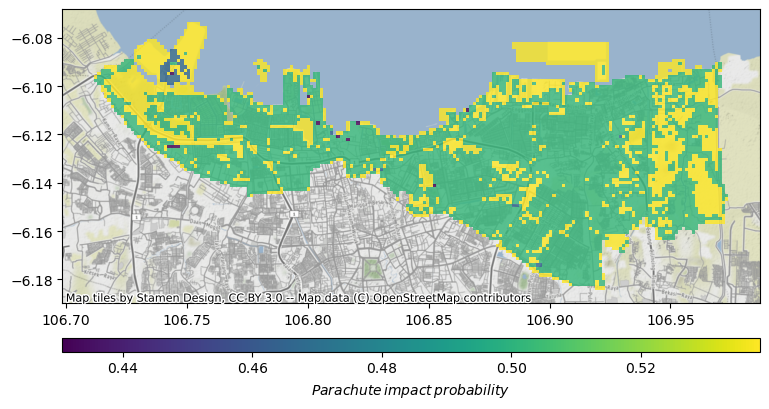

In [64]:
import contextily as ctx
import matplotlib.pyplot as plt

inspire2_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
inspire2_final_risk.plot(column='parachute risk', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(inspire2_final_risk['parachute risk'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Parachute\,impact\,probability$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=inspire2_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Inspire Parachute Risk.pdf', bbox_inches='tight')


plt.show()

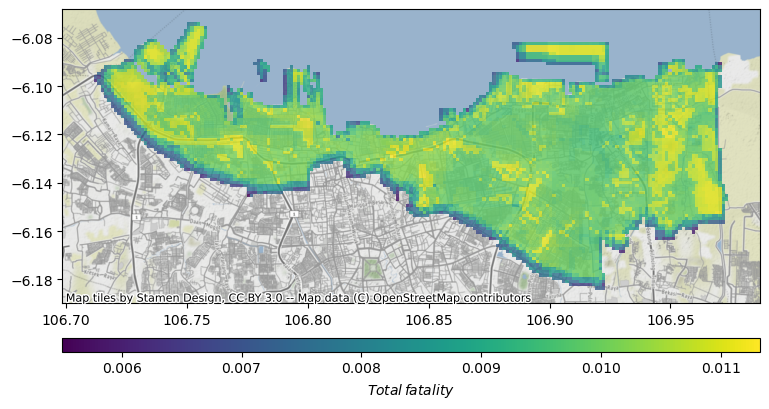

In [65]:
import contextily as ctx
import matplotlib.pyplot as plt

inspire2_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
inspire2_final_risk.plot(column='fatality risk total', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(inspire2_final_risk['fatality risk total'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Total\,fatality$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=inspire2_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Inspire Total Fatality.pdf', bbox_inches='tight')


plt.show()

# Parrot Disco

In [9]:
disco_final_risk = fh.load_gdf("Disco Final_risk","D:\\TUGAS SEKOLAH\\College\\Smst 7, Odd 2023\\UAV PATH PLANNER\\city_data\\7626002_Jakarta Utara")

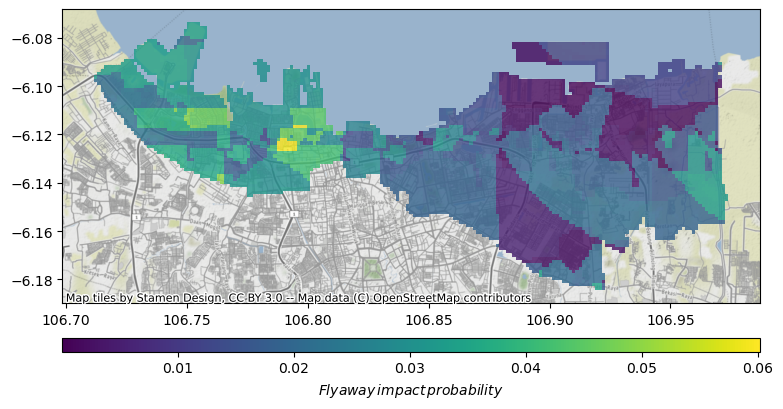

In [67]:
import contextily as ctx
import matplotlib.pyplot as plt

disco_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
disco_final_risk.plot(column='flyaway risk', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(disco_final_risk['flyaway risk'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Flyaway \,impact\,probability$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=disco_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Disco Flyaway Risk.pdf', bbox_inches='tight')


plt.show()

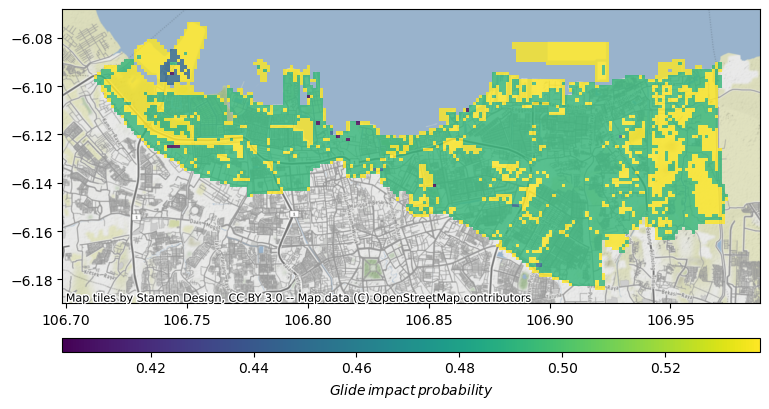

In [68]:
import contextily as ctx
import matplotlib.pyplot as plt

disco_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
disco_final_risk.plot(column='glide risk', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(disco_final_risk['glide risk'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Glide \,impact\,probability$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=disco_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Disco Glide Risk.pdf', bbox_inches='tight')


plt.show()

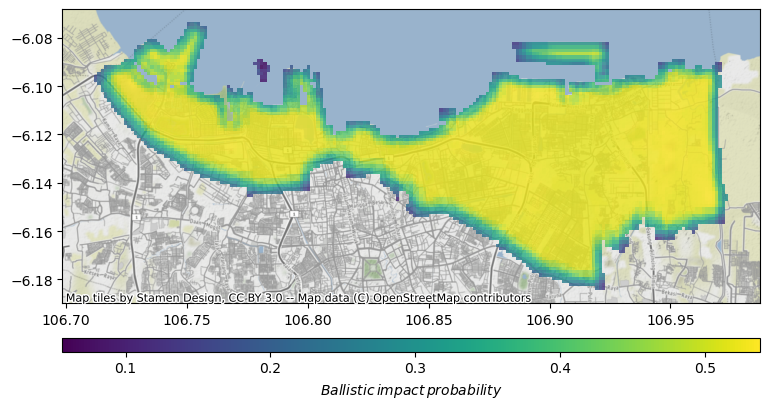

In [69]:
import contextily as ctx
import matplotlib.pyplot as plt

disco_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
disco_final_risk.plot(column='ballistic risk', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(disco_final_risk['ballistic risk'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Ballistic\,impact\,probability$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=disco_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Disco Ballistic Risk.pdf', bbox_inches='tight')


plt.show()

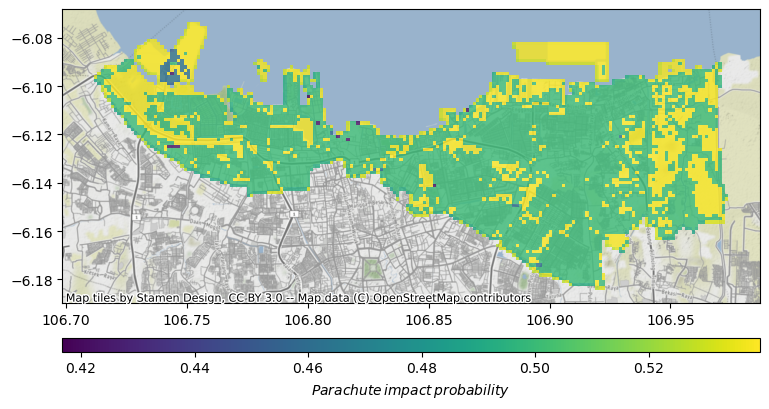

In [70]:
import contextily as ctx
import matplotlib.pyplot as plt

disco_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
disco_final_risk.plot(column='parachute risk', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(disco_final_risk['parachute risk'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Parachute\,impact\,probability$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=disco_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Disco Parachute Risk.pdf', bbox_inches='tight')


plt.show()

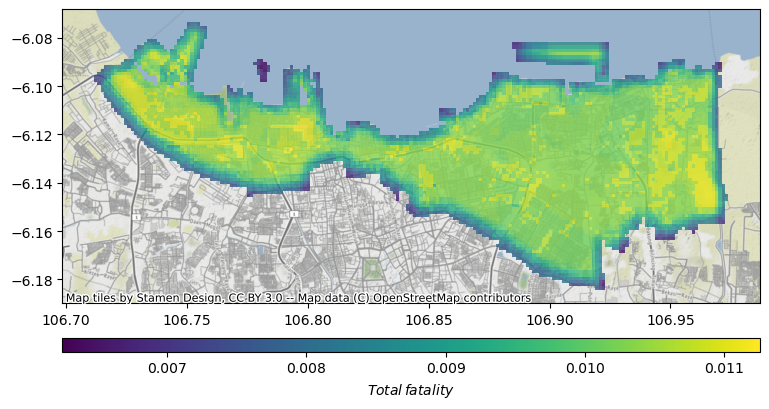

In [71]:
import contextily as ctx
import matplotlib.pyplot as plt

disco_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
disco_final_risk.plot(column='fatality risk total', alpha=0.8, ax=ax)

sm = plt.cm.ScalarMappable()
sm.set_array(disco_final_risk['fatality risk total'])
cbar = fig.colorbar(sm, ax=ax, aspect=50, pad=0.05, orientation='horizontal', label="$Total\,fatality$")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=disco_final_risk.crs, )
# Set the LaTeX font and other options (optional)


# Save the plot as a PGF file
plt.savefig('Disco Total Fatality.pdf', bbox_inches='tight')


plt.show()

Ballistic

# Total Combine areal risk DataFrame

In [58]:
talon_final_risk.columns

Index(['geometry', 'quadkey', 'id', 'area', 'shelter factor', 'no fly zone',
       'height', 'population', 'pre fatality', 'impact score',
       'fly level score', 'fatality risk total', 'total risk', 'risk non inf',
       'ballistic risk', 'glide risk', 'flyaway risk'],
      dtype='object')

In [ ]:
talon_final_risk['parachute risk'].sum()
phantom4_final_risk['parachute risk'].sum()
inspire2_final_risk['parachute risk'].sum()
disco_final_risk['parachute risk'].sum()

In [5]:
talon_final_risk.shape[0]

7087

In [12]:
import pandas as pd

data = {
    'Talon': [talon_final_risk['ballistic risk'].sum(), talon_final_risk['flyaway risk'].sum(),talon_final_risk['glide risk'].sum(), talon_final_risk['parachute risk'].sum(), talon_final_risk['fatality risk total'].sum(), talon_final_risk['fatality risk total'].sum()/talon_final_risk.shape[0]],
    'Disco': [disco_final_risk['ballistic risk'].sum(), disco_final_risk['flyaway risk'].sum(), disco_final_risk['glide risk'].sum(),disco_final_risk['parachute risk'].sum(), inspire2_final_risk['fatality risk total'].sum(), inspire2_final_risk['fatality risk total'].sum()/talon_final_risk.shape[0]],
    'DJI Phantom 4': [phantom4_final_risk['ballistic risk'].sum(), phantom4_final_risk['flyaway risk'].sum(), phantom4_final_risk['glide risk'].sum(), phantom4_final_risk['parachute risk'].sum(), phantom4_final_risk['fatality risk total'].sum(), phantom4_final_risk['fatality risk total'].sum()/talon_final_risk.shape[0]],
    'DJI Inspire 2': [inspire2_final_risk['ballistic risk'].sum(), inspire2_final_risk['flyaway risk'].sum(), inspire2_final_risk['glide risk'].sum(), inspire2_final_risk['parachute risk'].sum(), inspire2_final_risk['fatality risk total'].sum(), inspire2_final_risk['fatality risk total'].sum()/talon_final_risk.shape[0]],
}



index = ['Ballistic impact probability', 'Fly away impact probability',
         'Glide impact probability', 'Parachute impact probability', 'Total fatality risk probability', 'Average areal total fatality risk']

df = pd.DataFrame(data, index=index)

# Save DataFrame to a CSV file
df.to_latex('Impact_risk_summarize.tex', index=True)

C:\Users\MICKO\AppData\Local\Temp\ipykernel_1084\3943635528.py:18: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  df.to_latex('Impact_risk_summarize.tex', index=True)


In [11]:
df

,Talon,Disco,DJI Phantom 4,DJI Inspire 2
Ballistic impact probability,3357.142553,3303.336594,3452.695201,3284.220663
Fly away impact probability,6.004905,136.521018,651.025645,248.005463
Glide impact probability,3420.454716,3584.184491,3576.983890,3420.454716
Parachute impact probability,3635.634721,3616.844608,3624.644006,3631.138685
Total fatality risk probability,67.836022,69.526808,76.807047,69.526808
Average areal total fatality risk,0.009572,0.009810,0.010838,0.009810


# Map base

In [82]:
from upt.utils.file_handle import FileHandle
fh = FileHandle("7626002_Jakarta Utara")
talon_final_risk = fh.load_gdf("Talon Final_risk","D:\\TUGAS SEKOLAH\\College\\Smst 7, Odd 2023\\UAV PATH PLANNER\\city_data\\7626002_Jakarta Utara")

In [83]:
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="UAV Path Finder")

Start Point

In [84]:
import geopandas as gpd
location = geolocator.geocode("Pluit Village")
latitude = location.latitude
longitude = location.longitude

geometry = gpd.points_from_xy([longitude], [latitude])
start_point = gpd.GeoDataFrame(geometry=geometry)
start_point = start_point.set_crs("EPSG:4326")

End Point

In [86]:
location = geolocator.geocode("Sunter Mall")
latitude = location.latitude
longitude = location.longitude

geometry = gpd.points_from_xy([longitude], [latitude])
end_point = gpd.GeoDataFrame(geometry=geometry)
end_point = end_point.set_crs("EPSG:4326")

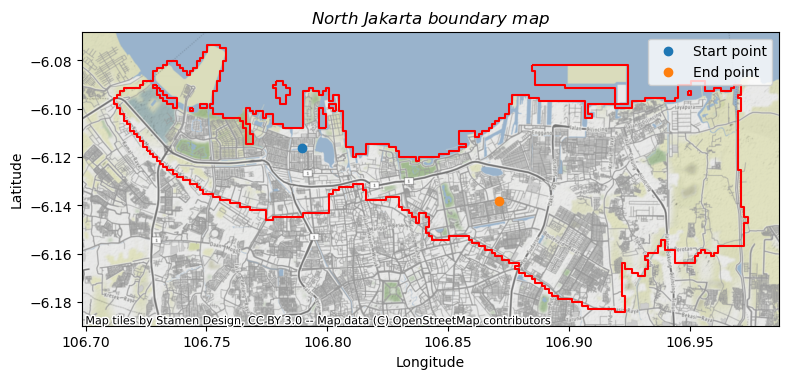

In [34]:
import contextily as ctx
import matplotlib.pyplot as plt

talon_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
talon_final_risk.dissolve().boundary.plot(alpha=1, ax=ax,color="red")
start_point.plot(ax=ax, label="Start point")
end_point.plot(ax=ax, label="End point")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=talon_final_risk.crs, )
# Set the LaTeX font and other options (optional)


ax.set_title('$North\ Jakarta\ boundary\ map$')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
# Save the plot as a PGF file
plt.savefig('plot_NJakarta_base_map.pdf', bbox_inches='tight')

plt.legend()
plt.show()

# PathFinder

In [78]:
import geopandas as gpd
import pandas as pd
import numpy as np
from upt.preprocessor.features_of_interest import FeatureOfInterest as foi
from upt.postprocessor.a_star import AStar
# from upt.utils.geo_utils import line_smoothing 

In [79]:
from upt.utils.file_handle import FileHandle
fh = FileHandle("7626002_Jakarta Utara")
talon_final_risk = fh.load_gdf("Talon Final_risk","D:\\TUGAS SEKOLAH\\College\\Smst 7, Odd 2023\\UAV PATH PLANNER\\city_data\\7626002_Jakarta Utara")
disco_final_risk = fh.load_gdf("Disco Final_risk","D:\\TUGAS SEKOLAH\\College\\Smst 7, Odd 2023\\UAV PATH PLANNER\\city_data\\7626002_Jakarta Utara")
inspire2_final_risk = fh.load_gdf("Inspire 2 Final_risk","D:\\TUGAS SEKOLAH\\College\\Smst 7, Odd 2023\\UAV PATH PLANNER\\city_data\\7626002_Jakarta Utara")
phantom4_final_risk = fh.load_gdf("Phantom 4 Final_risk","D:\\TUGAS SEKOLAH\\College\\Smst 7, Odd 2023\\UAV PATH PLANNER\\city_data\\7626002_Jakarta Utara")

# Normal ASTAR (Inlcude Talon, Phantom, Inspire, Disco)

D:\TUGAS SEKOLAH\College\Smst 7, Odd 2023\UAV PATH PLANNER\upt\postprocessor\a_star.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  self.centroids = np.column_stack((gdf.to_crs(self.crs).centroid.x, gdf.to_crs(self.crs).centroid.y))
D:\TUGAS SEKOLAH\College\Smst 7, Odd 2023\UAV PATH PLANNER\upt\postprocessor\a_star.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  self.centroids = np.column_stack((gdf.to_crs(self.crs).centroid.x, gdf.to_crs(self.crs).centroid.y))
C:\Users\MICKO\anaconda3\envs\ox\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


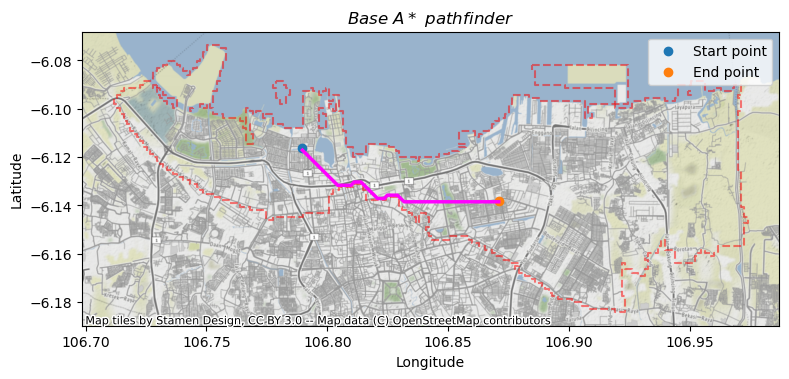

In [87]:
astar = AStar(talon_final_risk,'fatality risk total',crs=talon_final_risk.crs)
astar.run_instance("Pluit Village","Sunter Mall")
way_marker = astar.create_line()

from upt.postprocessor.line_smoothing import non_smooth
gpd_proccessed = non_smooth(way_marker, talon_final_risk.crs)

talon_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
talon_final_risk.dissolve().boundary.plot(alpha=0.5, ax=ax,color="red", linestyle='--')
gpd_proccessed.to_crs("EPSG:4326").plot(ax=ax,color="Magenta", linewidth=2.5)
start_point.plot(ax=ax, label="Start point")
end_point.plot(ax=ax, label="End point")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=talon_final_risk.crs, )
# Set the LaTeX font and other options (optional)

ax.set_title('$Base\ A*\ pathfinder$')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
# Save the plot as a PGF file
plt.savefig('plot_base_Astar.pdf', bbox_inches='tight')

plt.legend()
plt.show()

# Risk A STAR Talon

D:\TUGAS SEKOLAH\College\Smst 7, Odd 2023\UAV PATH PLANNER\upt\postprocessor\a_star.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  self.centroids = np.column_stack((gdf.to_crs(self.crs).centroid.x, gdf.to_crs(self.crs).centroid.y))
D:\TUGAS SEKOLAH\College\Smst 7, Odd 2023\UAV PATH PLANNER\upt\postprocessor\a_star.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  self.centroids = np.column_stack((gdf.to_crs(self.crs).centroid.x, gdf.to_crs(self.crs).centroid.y))
C:\Users\MICKO\anaconda3\envs\ox\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


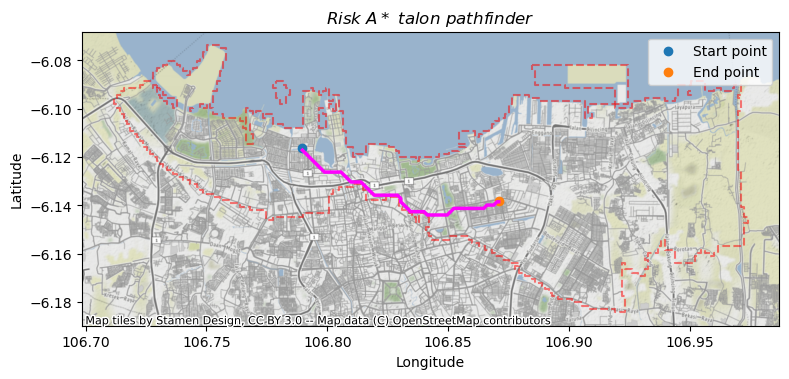

In [88]:
import geopandas as gpd
import pandas as pd
import numpy as np
from upt.preprocessor.features_of_interest import FeatureOfInterest as foi
from upt.postprocessor.a_star import AStar

astar = AStar(talon_final_risk,'fatality risk total',crs=talon_final_risk.crs, custom_func="Risk ASTAR")
astar.run_instance("Pluit Village","Sunter Mall")
way_marker = astar.create_line()

from upt.postprocessor.line_smoothing import non_smooth
gpd_proccessed = non_smooth(way_marker, talon_final_risk.crs)

talon_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
talon_final_risk.dissolve().boundary.plot(alpha=0.5, ax=ax,color="red", linestyle='--')
gpd_proccessed.to_crs("EPSG:4326").plot(ax=ax,color="Magenta", linewidth=2.5)
start_point.plot(ax=ax, label="Start point")
end_point.plot(ax=ax, label="End point")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=talon_final_risk.crs, )
# Set the LaTeX font and other options (optional)

ax.set_title('$Risk\ A*\ talon\ pathfinder$')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
# Save the plot as a PGF file
plt.savefig('plot_Risk_Astar_Talon.pdf', bbox_inches='tight')

plt.legend()
plt.show()

# Risk A STAR Disco

D:\TUGAS SEKOLAH\College\Smst 7, Odd 2023\UAV PATH PLANNER\upt\postprocessor\a_star.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  self.centroids = np.column_stack((gdf.to_crs(self.crs).centroid.x, gdf.to_crs(self.crs).centroid.y))
D:\TUGAS SEKOLAH\College\Smst 7, Odd 2023\UAV PATH PLANNER\upt\postprocessor\a_star.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  self.centroids = np.column_stack((gdf.to_crs(self.crs).centroid.x, gdf.to_crs(self.crs).centroid.y))
C:\Users\MICKO\anaconda3\envs\ox\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


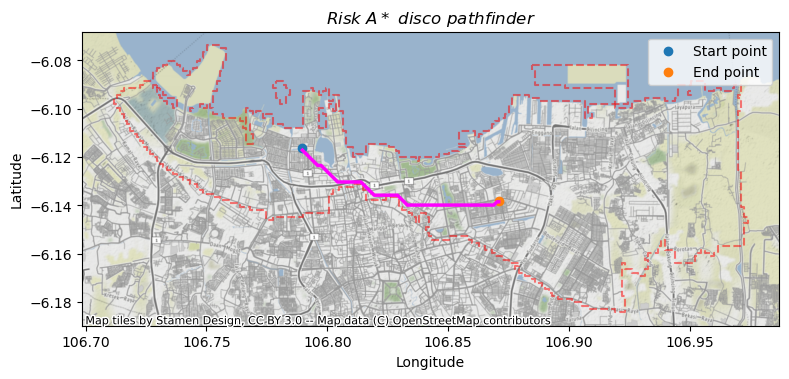

In [89]:
import geopandas as gpd
import pandas as pd
import numpy as np
from upt.preprocessor.features_of_interest import FeatureOfInterest as foi
from upt.postprocessor.a_star import AStar

astar = AStar(disco_final_risk,'fatality risk total',crs=talon_final_risk.crs, custom_func="Risk ASTAR")
astar.run_instance("Pluit Village","Sunter Mall")
way_marker = astar.create_line()

from upt.postprocessor.line_smoothing import non_smooth
gpd_proccessed = non_smooth(way_marker, talon_final_risk.crs)

disco_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
disco_final_risk.dissolve().boundary.plot(alpha=0.5, ax=ax,color="red", linestyle='--')
gpd_proccessed.to_crs("EPSG:4326").plot(ax=ax,color="Magenta", linewidth=2.5)
start_point.plot(ax=ax, label="Start point")
end_point.plot(ax=ax, label="End point")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=talon_final_risk.crs, )
# Set the LaTeX font and other options (optional)

ax.set_title('$Risk\ A*\ disco\ pathfinder$')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
# Save the plot as a PGF file
plt.savefig('plot_Risk_Astar_Disco.pdf', bbox_inches='tight')

plt.legend()
plt.show()

# Risk A STAR Inspire 2

D:\TUGAS SEKOLAH\College\Smst 7, Odd 2023\UAV PATH PLANNER\upt\postprocessor\a_star.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  self.centroids = np.column_stack((gdf.to_crs(self.crs).centroid.x, gdf.to_crs(self.crs).centroid.y))
D:\TUGAS SEKOLAH\College\Smst 7, Odd 2023\UAV PATH PLANNER\upt\postprocessor\a_star.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  self.centroids = np.column_stack((gdf.to_crs(self.crs).centroid.x, gdf.to_crs(self.crs).centroid.y))
C:\Users\MICKO\anaconda3\envs\ox\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


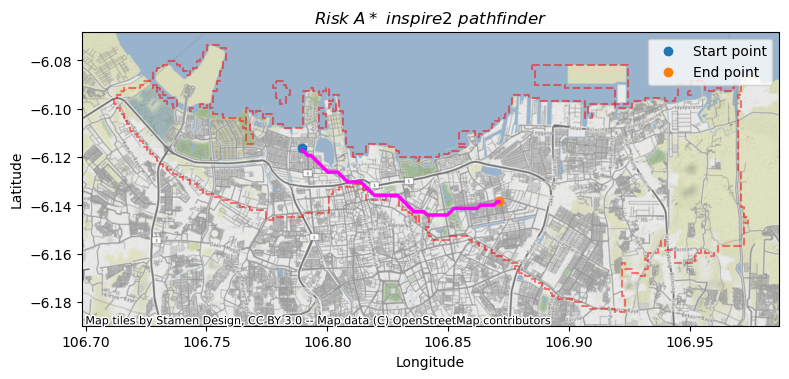

In [90]:
import geopandas as gpd
import pandas as pd
import numpy as np
from upt.preprocessor.features_of_interest import FeatureOfInterest as foi
from upt.postprocessor.a_star import AStar

astar = AStar(inspire2_final_risk,'fatality risk total',crs=talon_final_risk.crs, custom_func="Risk ASTAR")
astar.run_instance("Pluit Village","Sunter Mall")
way_marker = astar.create_line()

from upt.postprocessor.line_smoothing import non_smooth
gpd_proccessed = non_smooth(way_marker, talon_final_risk.crs)

inspire2_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
inspire2_final_risk.dissolve().boundary.plot(alpha=0.5, ax=ax,color="red", linestyle='--')
gpd_proccessed.to_crs("EPSG:4326").plot(ax=ax,color="Magenta", linewidth=2.5)
start_point.plot(ax=ax, label="Start point")
end_point.plot(ax=ax, label="End point")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=inspire2_final_risk.crs, )
# Set the LaTeX font and other options (optional)

ax.set_title('$Risk\ A*\ inspire 2\ pathfinder$')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
# Save the plot as a PGF file
plt.savefig('plot_Risk_Astar_Inspire 2.pdf', bbox_inches='tight')

plt.legend()
plt.show()

# Risk A STAR Phantom 4

D:\TUGAS SEKOLAH\College\Smst 7, Odd 2023\UAV PATH PLANNER\upt\postprocessor\a_star.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  self.centroids = np.column_stack((gdf.to_crs(self.crs).centroid.x, gdf.to_crs(self.crs).centroid.y))
D:\TUGAS SEKOLAH\College\Smst 7, Odd 2023\UAV PATH PLANNER\upt\postprocessor\a_star.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  self.centroids = np.column_stack((gdf.to_crs(self.crs).centroid.x, gdf.to_crs(self.crs).centroid.y))
C:\Users\MICKO\anaconda3\envs\ox\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


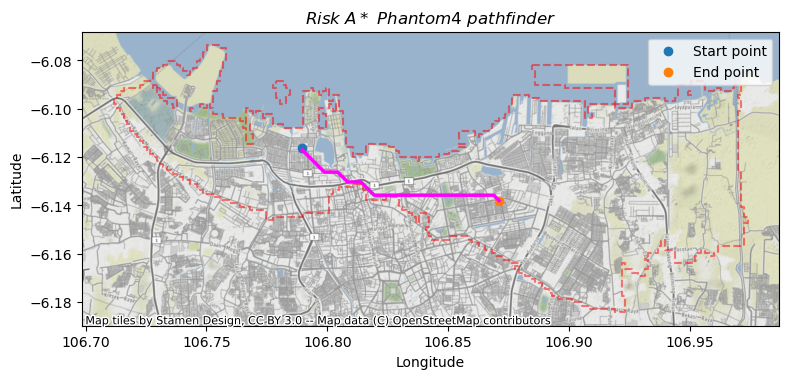

In [91]:
import geopandas as gpd
import pandas as pd
import numpy as np
from upt.preprocessor.features_of_interest import FeatureOfInterest as foi
from upt.postprocessor.a_star import AStar

astar = AStar(phantom4_final_risk,'fatality risk total',crs=talon_final_risk.crs, custom_func="Risk ASTAR")
astar.run_instance("Pluit Village","Sunter Mall")
way_marker = astar.create_line()

from upt.postprocessor.line_smoothing import non_smooth
gpd_proccessed = non_smooth(way_marker, talon_final_risk.crs)

phantom4_final_risk.to_crs("EPSG:4326",inplace=True)
fig, ax = plt.subplots(figsize=(9, 9))
phantom4_final_risk.dissolve().boundary.plot(alpha=0.5, ax=ax,color="red", linestyle='--')
gpd_proccessed.to_crs("EPSG:4326").plot(ax=ax,color="Magenta", linewidth=2.5)
start_point.plot(ax=ax, label="Start point")
end_point.plot(ax=ax, label="End point")

# Add basemap tiles using contextily
ctx.add_basemap(ax, crs=phantom4_final_risk.crs, )
# Set the LaTeX font and other options (optional)

ax.set_title('$Risk\ A*\ Phantom 4\ pathfinder$')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
# Save the plot as a PGF file
plt.savefig('plot_Risk_Astar_Phantom 4.pdf', bbox_inches='tight')

plt.legend()
plt.show()

# Waypoint vs Risk_A 

In [92]:
from upt.utils.file_handle import FileHandle
import geopandas as gpd
import pandas as pd
import numpy as np

fh = FileHandle("7626002_Jakarta Utara")
talon_final_risk = fh.load_gdf("Talon Final_risk","D:\\TUGAS SEKOLAH\\College\\Smst 7, Odd 2023\\UAV PATH PLANNER\\city_data\\7626002_Jakarta Utara")
disco_final_risk = fh.load_gdf("Disco Final_risk","D:\\TUGAS SEKOLAH\\College\\Smst 7, Odd 2023\\UAV PATH PLANNER\\city_data\\7626002_Jakarta Utara")
inspire2_final_risk = fh.load_gdf("Inspire 2 Final_risk","D:\\TUGAS SEKOLAH\\College\\Smst 7, Odd 2023\\UAV PATH PLANNER\\city_data\\7626002_Jakarta Utara")
phantom4_final_risk = fh.load_gdf("Phantom 4 Final_risk","D:\\TUGAS SEKOLAH\\College\\Smst 7, Odd 2023\\UAV PATH PLANNER\\city_data\\7626002_Jakarta Utara")

In [93]:
import geopandas as gpd
import pandas as pd
import numpy as np
from upt.preprocessor.features_of_interest import FeatureOfInterest as foi
from upt.postprocessor.a_star import AStar
from upt.postprocessor.line_smoothing import non_smooth

# Talon
talon_astar = AStar(talon_final_risk,'fatality risk total',crs=talon_final_risk.crs, custom_func="Risk ASTAR")
talon_astar.run_instance("Pluit Village","Sunter Mall")
way_marker = talon_astar.create_line()
talon_gpd_proccessed = non_smooth(way_marker, talon_final_risk.crs)
talon_gpd_proccessed = talon_gpd_proccessed.sjoin(talon_final_risk)
talon_gpd_proccessed['distance'] = np.sqrt(talon_gpd_proccessed['area'])

# Disco
disco_astar = AStar(disco_final_risk,'fatality risk total',crs=disco_final_risk.crs, custom_func="Risk ASTAR")
disco_astar.run_instance("Pluit Village","Sunter Mall")
way_marker = disco_astar.create_line()
disco_gpd_proccessed = non_smooth(way_marker, disco_final_risk.crs)
disco_gpd_proccessed = disco_gpd_proccessed.sjoin(disco_final_risk)
disco_gpd_proccessed['distance'] = np.sqrt(disco_gpd_proccessed['area'])

# Inspire
inspire2_astar = AStar(inspire2_final_risk,'fatality risk total',crs=inspire2_final_risk.crs, custom_func="Risk ASTAR")
inspire2_astar.run_instance("Pluit Village","Sunter Mall")
way_marker = inspire2_astar.create_line()
inspire2_gpd_proccessed = non_smooth(way_marker, inspire2_final_risk.crs)
inspire2_gpd_proccessed = inspire2_gpd_proccessed.sjoin(inspire2_final_risk)
inspire2_gpd_proccessed['distance'] = np.sqrt(inspire2_gpd_proccessed['area'])

# Phantom
phantom4_astar = AStar(phantom4_final_risk,'fatality risk total',crs=phantom4_final_risk.crs, custom_func="Risk ASTAR")
phantom4_astar.run_instance("Pluit Village","Sunter Mall")
way_marker = phantom4_astar.create_line()
phantom4_gpd_proccessed = non_smooth(way_marker, phantom4_final_risk.crs)
phantom4_gpd_proccessed = phantom4_gpd_proccessed.sjoin(phantom4_final_risk)
phantom4_gpd_proccessed['distance'] = np.sqrt(phantom4_gpd_proccessed['area'])

#Base Map
base_astar = AStar(talon_final_risk,'fatality risk total',crs=talon_final_risk.crs)
base_astar.run_instance("Pluit Village","Sunter Mall")
way_marker = base_astar.create_line()

base_gpd_proccessed = non_smooth(way_marker, phantom4_final_risk.crs)
base_gpd_proccessed = base_gpd_proccessed.sjoin(phantom4_final_risk)
base_gpd_proccessed['distance'] = np.sqrt(base_gpd_proccessed['area'])

C:\Users\MICKO\anaconda3\envs\ox\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)
C:\Users\MICKO\anaconda3\envs\ox\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)
C:\Users\MICKO\anaconda3\envs\ox\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)
C:\Users\MICKO\anaconda3\envs\ox\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)
C:\Users\MICKO\anaconda3\envs\ox\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  war

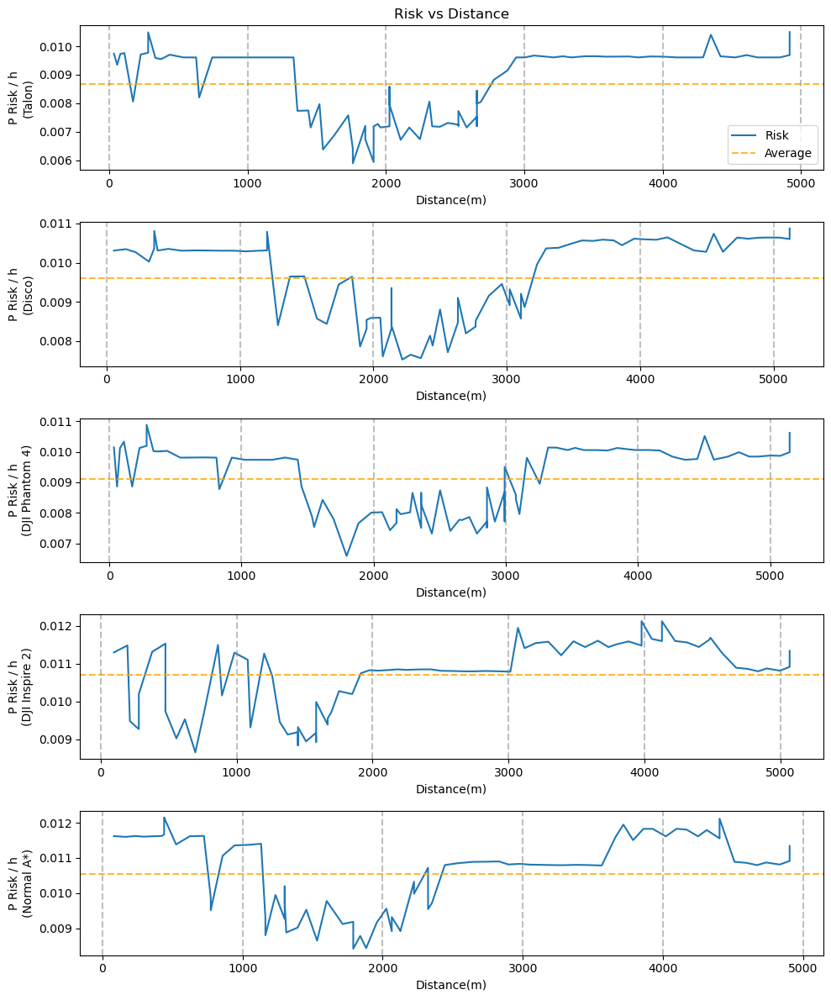

In [94]:
import matplotlib.pyplot as plt

# Create some data for the plots
distance = [talon_gpd_proccessed['distance'].cumsum(), 
            disco_gpd_proccessed['distance'].cumsum(), 
            inspire2_gpd_proccessed['distance'].cumsum(), 
            phantom4_gpd_proccessed['distance'].cumsum(),
            base_gpd_proccessed['distance'].cumsum()
           ]
p_risk = [
    talon_gpd_proccessed['fatality risk total'],
    disco_gpd_proccessed['fatality risk total'],
    inspire2_gpd_proccessed['fatality risk total'],
    phantom4_gpd_proccessed['fatality risk total'],
    base_gpd_proccessed['fatality risk total']
]
drone_names = ['Talon', 'Disco', 'DJI Phantom 4', 'DJI Inspire 2', 'Normal A*']

# Create a figure with 4 subplots in a single column
fig, axs = plt.subplots(5, 1, figsize=(10, 12))

# Iterate over each plot
for i in range(5):
    # Plot the data
    axs[i].plot(distance[i], p_risk[i])
    
    # Set x-axis label
    axs[i].set_xlabel('Distance(m)')
    
    # Set y-axis label with drone name
    axs[i].set_ylabel('P Risk / h\n({})'.format(drone_names[i]))
    
    avg_risk = np.mean(p_risk[i])
    
    # Add a dashed line for average risk
    axs[i].axhline(avg_risk, color='orange', linestyle='--', alpha=0.8)
    
    for j in range(0, 6000, 1000):
        axs[i].axvline(j, color='gray', linestyle='--', alpha=0.5)
    
    
    if i == 0:
        # Add legends for risk and mean values
        axs[i].set_title('{}'.format("Risk vs Distance"))
        axs[i].legend(['Risk', 'Average'],loc="lower right")

# Adjust the spacing between subplots
fig.tight_layout()
plt.savefig('Plot_risk_distance.pdf')
# Display the plots
plt.show()


Total travel distance vs Total Risk

In [95]:
import pandas as pd

# Create the data for the DataFrame
data = {
    'Talon': [talon_gpd_proccessed['distance'].sum(), talon_gpd_proccessed['fatality risk total'].sum()],
    'Disco': [disco_gpd_proccessed['distance'].sum(), disco_gpd_proccessed['fatality risk total'].sum()],
    'DJI Phantom 4': [phantom4_gpd_proccessed['distance'].sum(), phantom4_gpd_proccessed['fatality risk total'].sum()],
    'DJI Inspire 2': [inspire2_gpd_proccessed['distance'].sum(), inspire2_gpd_proccessed['fatality risk total'].sum()],
    'Normal A*': [base_gpd_proccessed['distance'].sum(), base_gpd_proccessed['fatality risk total'].sum()]
}


# Create the index labels
index = ['Total travelled distance', 'Total risk involved']


# Create the DataFrame
df_total_risk_travelled = pd.DataFrame(data, index=index)
df_total_risk_travelled.loc['Risk vs distance ratio'] = df_total_risk_travelled.loc['Total risk involved']/df_total_risk_travelled.loc['Total travelled distance'] 


df_total_risk_travelled.to_latex('Risk_path_summarize.tex', index=True)

C:\Users\MICKO\AppData\Local\Temp\ipykernel_13364\2977808113.py:22: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  df_total_risk_travelled.to_latex('Risk_path_summarize.tex', index=True)


In [96]:
df_total_risk_travelled

,Talon,Disco,DJI Phantom 4,DJI Inspire 2,Normal A*
Total travelled distance,4917.651992,5120.845475,5066.796306,5147.428533,4903.746901
Total risk involved,0.727661,0.759534,0.834316,0.765401,0.853452
Risk vs distance ratio,0.000148,0.000148,0.000165,0.000149,0.000174


# Min Max Average

In [97]:
import pandas as pd

# Define the index labels
drones = ['Talon', 'Disco', 'DJI Phantom 4', 'DJI Inspire 2']
secondary_index = ['min', 'max', 'avg']
index = pd.MultiIndex.from_product([drones, secondary_index], names=['Drone', 'Stat'])

# Define the column names
columns = ['Ballistic', 'Glide', 'Flyaway', 'Final Risk']

# Create the data for the DataFrame
data = [
    #Talon Data
    [talon_final_risk['ballistic risk'].min(), talon_final_risk['glide risk'].min(), talon_final_risk['flyaway risk'].min(), talon_final_risk['fatality risk total'].min()],
    [talon_final_risk['ballistic risk'].max(), talon_final_risk['glide risk'].max(), talon_final_risk['flyaway risk'].max(), talon_final_risk['fatality risk total'].max()],
    [talon_final_risk['ballistic risk'].mean(), talon_final_risk['glide risk'].mean(), talon_final_risk['flyaway risk'].mean(), talon_final_risk['fatality risk total'].mean()],
    #Disco Data
    [disco_final_risk['ballistic risk'].min(), disco_final_risk['glide risk'].min(), disco_final_risk['flyaway risk'].min(), disco_final_risk['fatality risk total'].min()],
    [disco_final_risk['ballistic risk'].max(), disco_final_risk['glide risk'].max(), disco_final_risk['flyaway risk'].max(), disco_final_risk['fatality risk total'].max()],
    [disco_final_risk['ballistic risk'].mean(), disco_final_risk['glide risk'].mean(), disco_final_risk['flyaway risk'].mean(), disco_final_risk['fatality risk total'].mean()],
    #DJi Phantom Data
    [phantom4_final_risk['ballistic risk'].min(), phantom4_final_risk['glide risk'].min(), phantom4_final_risk['flyaway risk'].min(), phantom4_final_risk['fatality risk total'].min()],
    [phantom4_final_risk['ballistic risk'].max(), phantom4_final_risk['glide risk'].max(), phantom4_final_risk['flyaway risk'].max(), phantom4_final_risk['fatality risk total'].max()],
    [phantom4_final_risk['ballistic risk'].mean(), phantom4_final_risk['glide risk'].mean(), phantom4_final_risk['flyaway risk'].mean(), phantom4_final_risk['fatality risk total'].mean()],
    #DJI Inspire Data
    [inspire2_final_risk['ballistic risk'].min(), inspire2_final_risk['glide risk'].min(), inspire2_final_risk['flyaway risk'].min(), inspire2_final_risk['fatality risk total'].min()],
    [inspire2_final_risk['ballistic risk'].max(), inspire2_final_risk['glide risk'].max(), inspire2_final_risk['flyaway risk'].max(), inspire2_final_risk['fatality risk total'].max()],
    [inspire2_final_risk['ballistic risk'].mean(), inspire2_final_risk['glide risk'].mean(), inspire2_final_risk['flyaway risk'].mean(), inspire2_final_risk['fatality risk total'].mean()],
]

# Create the DataFrame
df = pd.DataFrame(data, index=index, columns=columns)
df = df.applymap(lambda x: '%.2e' % x)

# Convert the DataFrame to LaTeX with scientific notation
latex_table = df.to_latex('Risk_pdf_aircraft.tex', index=True, float_format='%0.2e')

# Print the LaTeX table


C:\Users\MICKO\AppData\Local\Temp\ipykernel_13364\1254743470.py:36: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  latex_table = df.to_latex('Risk_pdf_aircraft.tex', index=True, float_format='%0.2e')


In [98]:
df

Ballistic     Glide   Flyaway Final Risk
Drone         Stat                                         
Talon         min   7.55e-02  3.14e-01  0.00e+00   5.36e-03
              max   5.38e-01  5.38e-01  7.76e-03   1.08e-02
              avg   4.74e-01  4.83e-01  8.47e-04   9.57e-03
Disco         min   5.63e-02  4.03e-01  5.38e-05   6.25e-03
              max   5.38e-01  5.38e-01  6.02e-02   1.13e-02
              avg   4.66e-01  5.06e-01  1.93e-02   9.91e-03
DJI Phantom 4 min   8.50e-02  3.99e-01  7.19e-03   6.85e-03
              max   5.39e-01  5.38e-01  1.79e-01   1.23e-02
              avg   4.87e-01  5.05e-01  9.19e-02   1.08e-02
DJI Inspire 2 min   6.03e-05  3.14e-01  0.00e+00   5.50e-03
              max   5.38e-01  5.38e-01  8.72e-02   1.13e-02
              avg   4.63e-01  4.83e-01  3.50e-02   9.81e-03

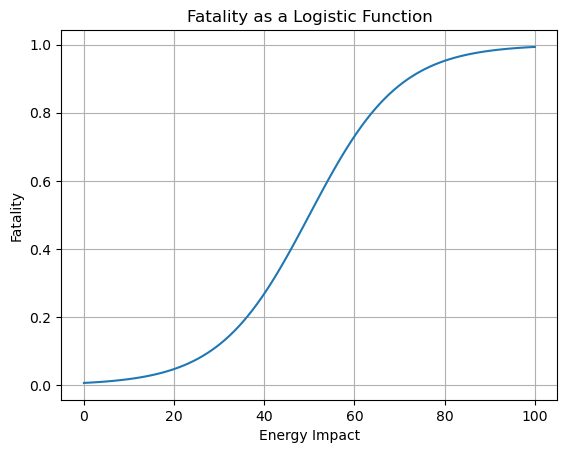

In [27]:
import matplotlib.pyplot as plt
import numpy as np

def logistic_function(x, threshold, energy_impact):
    return 1 / (1 + np.exp(-(x - threshold) / energy_impact))

# Parameters
threshold = 50
energy_impact = 10

# Generate x values from 0 to 100
x = np.linspace(0, 100, 100)

# Compute y values using the logistic function
y = logistic_function(x, threshold, energy_impact)

# Plot
plt.plot(x, y)
plt.xlabel('Energy Impact')
plt.ylabel('Fatality')
plt.title('Fatality as a Logistic Function')
plt.grid(True)
plt.show()

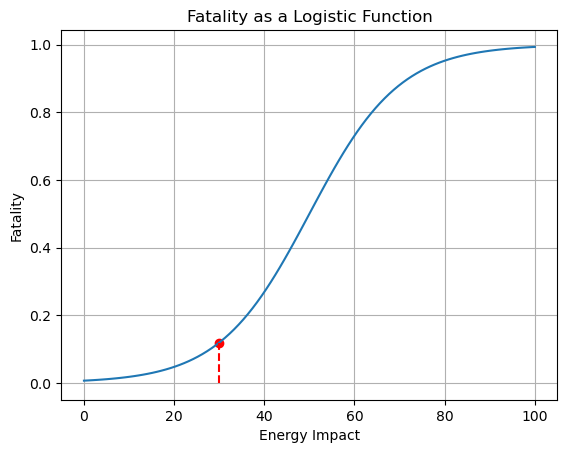

In [35]:
import matplotlib.pyplot as plt
import numpy as np

def logistic_function(x, threshold, energy_impact):
    return 1 / (1 + np.exp(-(x - threshold) / energy_impact))

# Parameters
threshold = 50
energy_impact = 10

# Generate x values from 0 to 100
x = np.linspace(0, 100, 100)

# Compute y values using the logistic function
y = logistic_function(x, threshold, energy_impact)

# Line parameters
energy_impact_line = 30
y_line = logistic_function(energy_impact_line, threshold, energy_impact)

# Plot
plt.plot(x, y)
plt.plot([energy_impact_line, energy_impact_line], [0, y_line], color='red', linestyle='--')
plt.scatter(energy_impact_line, y_line, color='red')
plt.xlabel('Energy Impact')
plt.ylabel('Fatality')
plt.title('Fatality as a Logistic Function')
plt.grid(True)

plt.savefig('fatality logistic func.pdf', bbox_inches="tight")
plt.show()

#LaTex Function
# f(x) = \frac{1}{1 + e^{-\frac{(x - \text{threshold})}{\text{energy impact}}}}